In [9]:
import matplotlib.pyplot as plt
import numpy as np

In [10]:
def compute_y(x, W, bias):
    # dreapta de decizie
    # [x, y] * [W[0], W[1]] + b = 0
     return (-x * W[0] - bias) / (W[1] + 1e-10)

def plot_decision_boundary(X, y , W, b, current_x, current_y, cnt):
    x1 = 0
    y1 = compute_y(x1, W, b)
    x2 = 1
    y2 = compute_y(x2, W, b)
    # sterge continutul ferestrei
    plt.clf()
    # ploteaza multimea de antrenare
    color = 'r'
    if(current_y == -1):
        color = 'b'
    plt.ylim((-1, 2))
    plt.xlim((-1, 2))
    plt.plot(X[y == -1, 0], X[y == -1, 1], 'b+')
    plt.plot(X[y == 1, 0], X[y == 1, 1], 'r+')
    # ploteaza exemplul curent
    plt.plot(current_x[0], current_x[1], color+'s')
    # afisarea dreptei de decizie
    plt.plot([x1, x2] ,[y1, y2], 'black')
    plt.title(f"Imag cu nr {cnt}")

    plt.show(block=False)
    plt.pause(0.3)

In [3]:
x = np.array([[0,0], [0, 1], [1, 0], [1, 1]])
y = np.array([-1, -1, 1, 1])

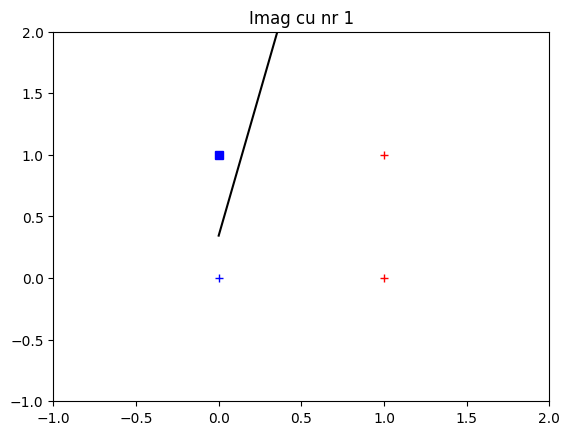

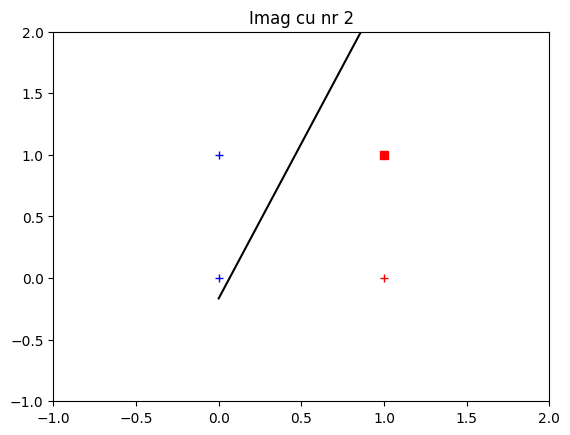

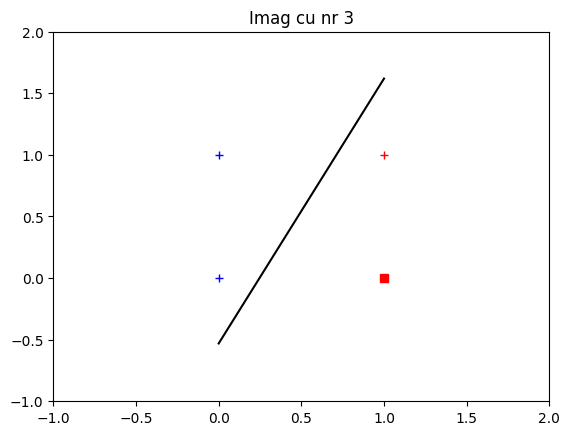

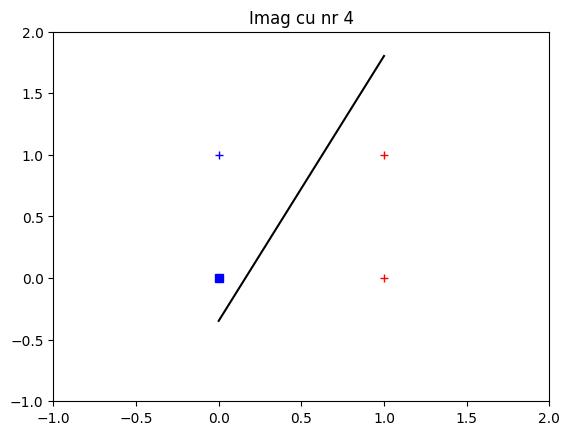

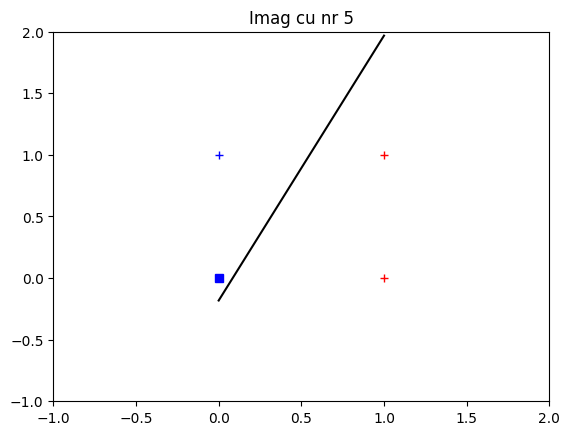

...

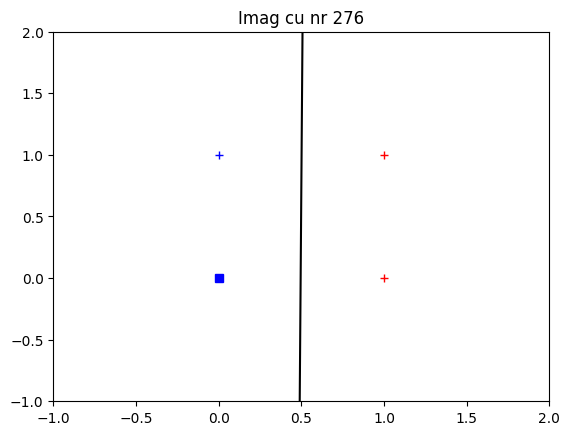

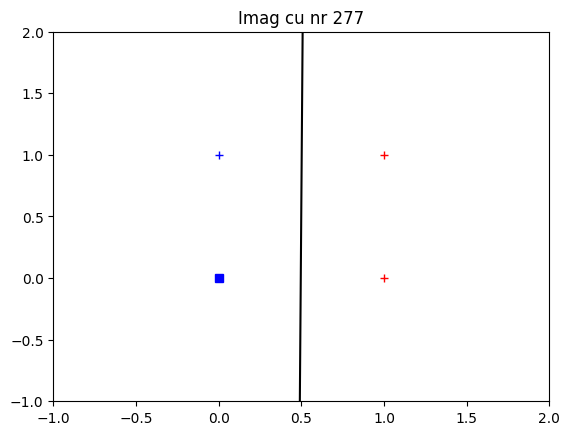

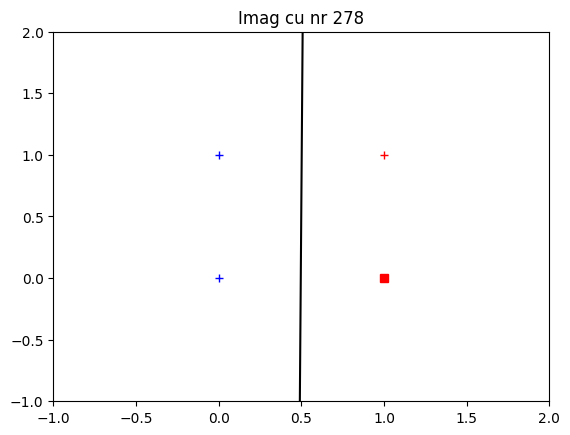

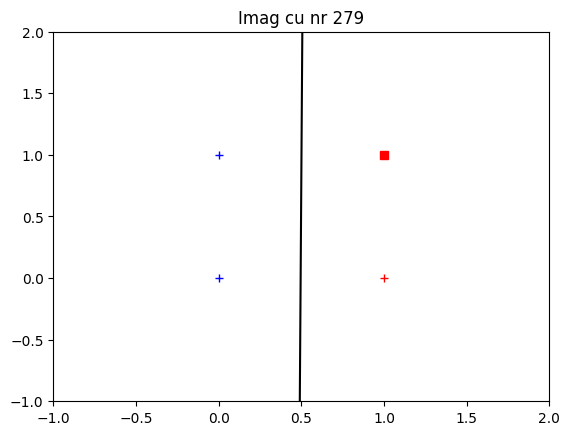

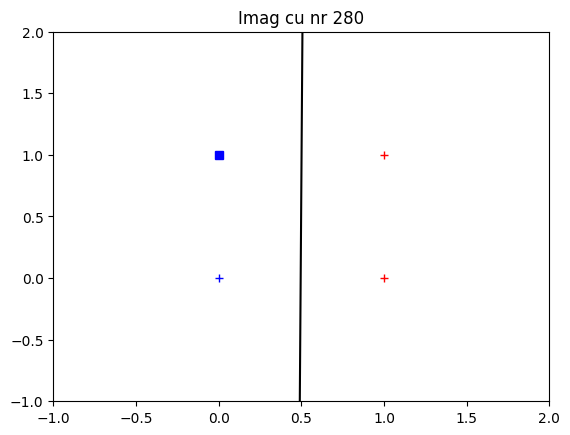

In [4]:
miu = 0
sigma = 1
w = np.random.normal( miu, sigma, (2,))
b = 0
eta = 0.1
epochs = 70
cnt = 1
for epoch in range(epochs):
    indices = np.random.permutation(len(x))
    for i in indices:
        x_ = x[i]
        y_ = y[i]

        z = np.dot(x_, w) + b
        w -= eta * (z - y_) * x_
        b -= eta * (z - y_)
        plot_decision_boundary(x, y, w, b, x_, y_, cnt)
        cnt = cnt + 1

In [6]:
preds = np.sign(np.dot(x, w) + b)
accuracy = np.mean(preds == y)
print(accuracy)
print(w)
print(b)

1.0
[ 1.98782527 -0.01055437]
-0.9858547261995073


In [ ]:
class model:
    def __init__(self, X=np.array([[0, 0], [0, 1], [1, 0], [1, 1]]), y=np.array([0, 1, 1, 0]), num_hidden=5, lr=0.5, epochs=70):
        self.X = X
        self.y = y
        self.num_hidden = num_hidden
        self.lr = lr
        self.epochs = epochs
        np.random.seed(0)

        miu = 0
        sigma = 1
        self.W_1 = np.random.normal(miu, sigma, (2, num_hidden))
        self.b_1 = np.zeros(num_hidden)
        self.W_2 = np.random.normal(miu, sigma, (num_hidden, 1))
        self.b_2 = np.zeros(1)

    def sigmoid(self, a):
        return 1 / (1 + np.exp(-a))

    def sigmoid_derivative(self, a):
        sig = self.sigmoid(a)
        return sig * (1 - sig)

    def tanh_derivative(self, a):
        return 1 - np.tanh(a) ** 2

    def forward(self, X):
        z1 = np.dot(X, self.W_1) + self.b_1
        a1 = np.tanh(z1)
        z2 = np.dot(a1, self.W_2) + self.b_2
        a2 = self.sigmoid(z2)
        return z1, a1, z2, a2

    def backward(self, a1, a2, z1):
        m = self.y.shape[0]
        dz2 = a2 - self.y.reshape(-1, 1)
        dw2 = np.dot(a1.T, dz2) / m
        db2 = np.sum(dz2) / m
        da1 = np.dot(dz2, self.W_2.T)
        dz1 = da1 * self.tanh_derivative(z1)
        dw1 = np.dot(self.X.T, dz1) / m
        db1 = np.sum(dz1, axis=0) / m
        return dw1, db1, dw2, db2

    def plot_decision(self):
        plt.clf()
        plt.ylim((-0.5, 1.5))
        plt.xlim((-0.5, 1.5))
        xx = np.random.normal(0, 1, (100000))
        yy = np.random.normal(0, 1, (100000))
        X_vis = np.array([xx, yy]).transpose()
        X_vis = np.concatenate((X_vis, self.X))
        _, _, _, output = self.forward(X_vis)
        y_vis = np.squeeze(np.round(output))
        plt.plot(X_vis[y_vis == 0, 0], X_vis[y_vis == 0, 1], 'b+')
        plt.plot(X_vis[y_vis == 1, 0], X_vis[y_vis == 1, 1], 'r+')
        plt.show(block=False)
        plt.pause(0.1)

    def train(self):
        for epoch in range(self.epochs):
            z1, a1, z2, a2 = self.forward(self.X)
            loss = (-self.y.reshape(-1, 1) * np.log(a2) - (1 - self.y).reshape(-1, 1) * np.log(1 - a2)).mean()
            accuracy = (np.round(a2).reshape(-1) == self.y).mean()

            print(f"Epoca {epoch+1:2d} | Loss: {loss:.4f} | Acuratețe: {accuracy:.2f}")
            self.plot_decision()

            dw1, db1, dw2, db2 = self.backward(a1, a2, z1)
            self.W_1 -= self.lr * dw1
            self.b_1 -= self.lr * db1
            self.W_2 -= self.lr * dw2
            self.b_2 -= self.lr * db2

        plt.show()


Epoca  1 | Loss: 2.1294 | Acuratețe: 0.75


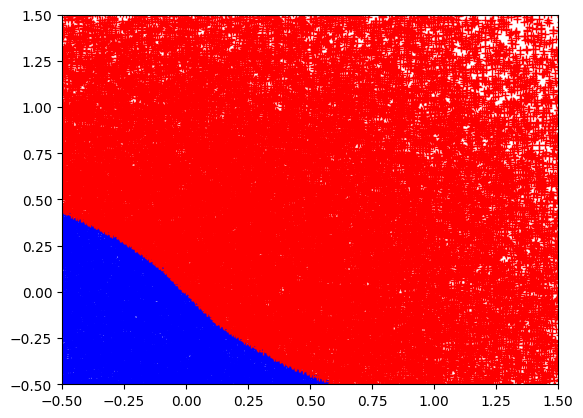

Epoca  2 | Loss: 5.2848 | Acuratețe: 0.50


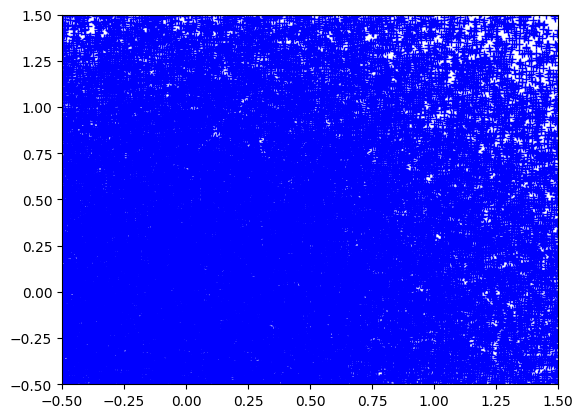

Epoca  3 | Loss: 2.6717 | Acuratețe: 0.50


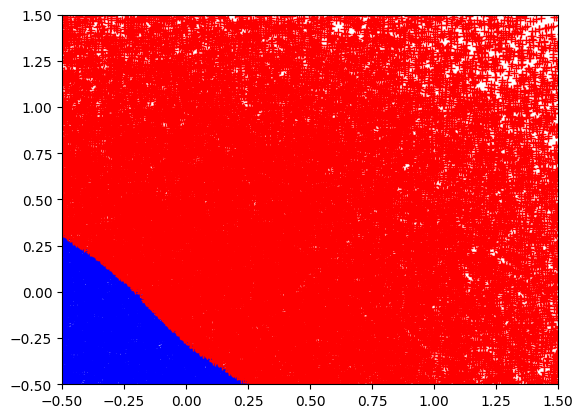

Epoca  4 | Loss: 3.3174 | Acuratețe: 0.50


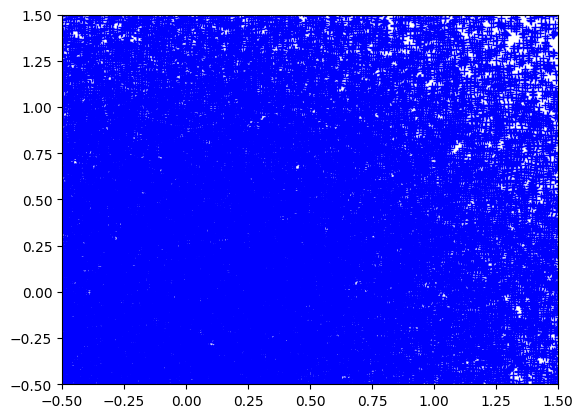

Epoca  5 | Loss: 2.0130 | Acuratețe: 0.75


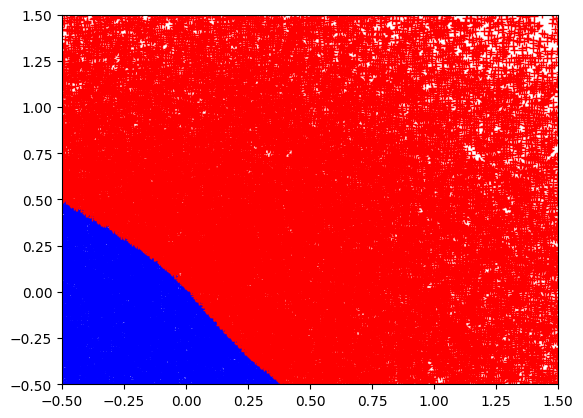

Epoca  6 | Loss: 0.6215 | Acuratețe: 0.50


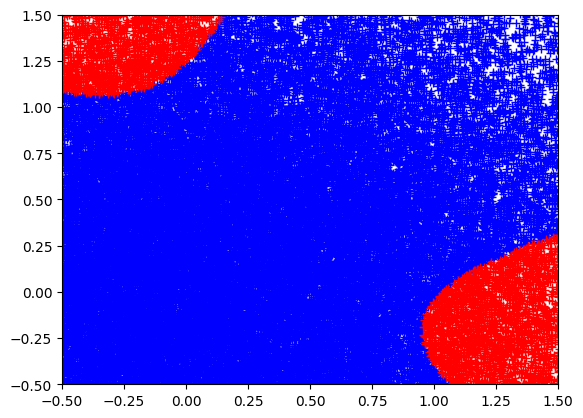

Epoca  7 | Loss: 1.1050 | Acuratețe: 0.75


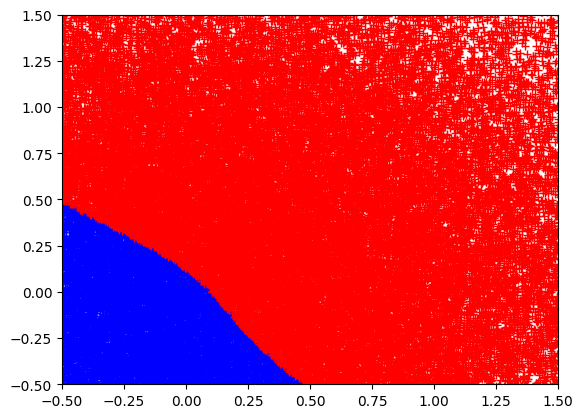

Epoca  8 | Loss: 0.2863 | Acuratețe: 1.00


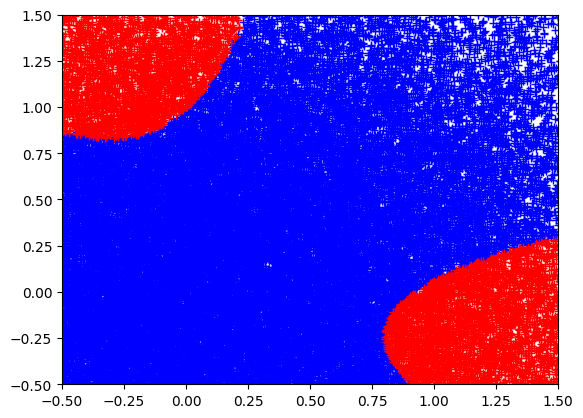

Epoca  9 | Loss: 0.0671 | Acuratețe: 1.00


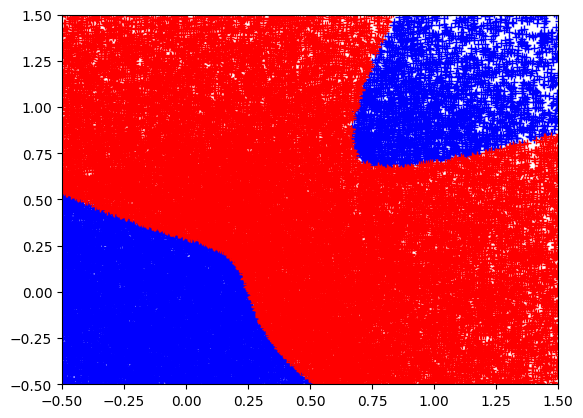

Epoca 10 | Loss: 0.0148 | Acuratețe: 1.00


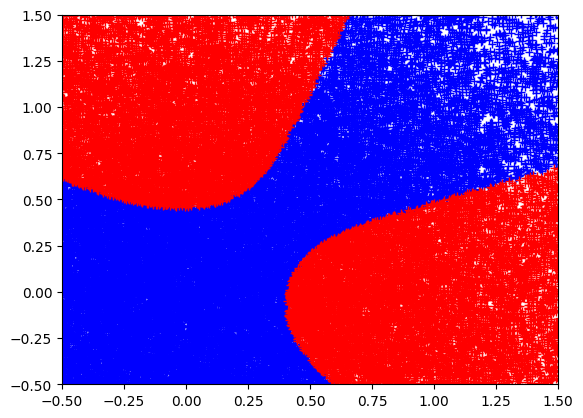

Epoca 11 | Loss: 0.0133 | Acuratețe: 1.00


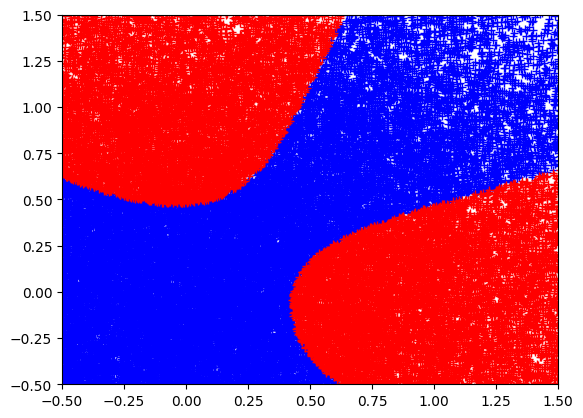

Epoca 12 | Loss: 0.0125 | Acuratețe: 1.00


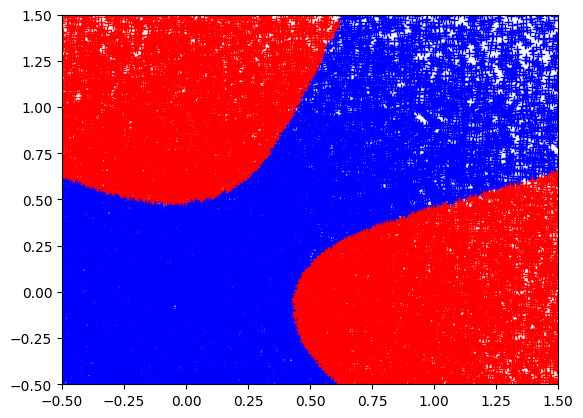

Epoca 13 | Loss: 0.0121 | Acuratețe: 1.00


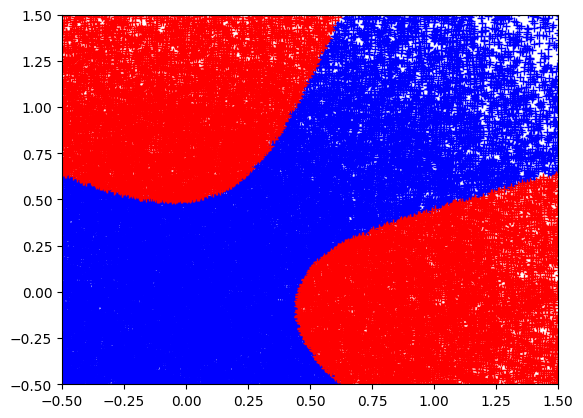

Epoca 14 | Loss: 0.0118 | Acuratețe: 1.00


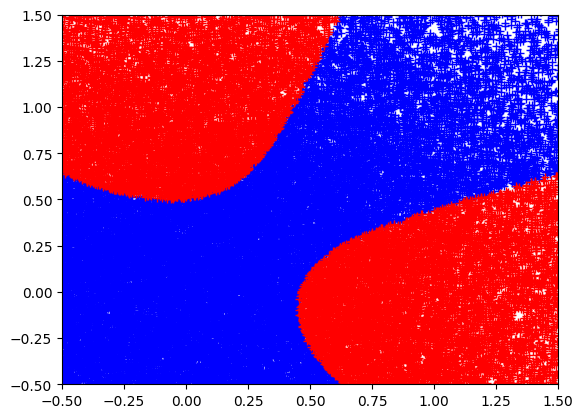

Epoca 15 | Loss: 0.0116 | Acuratețe: 1.00


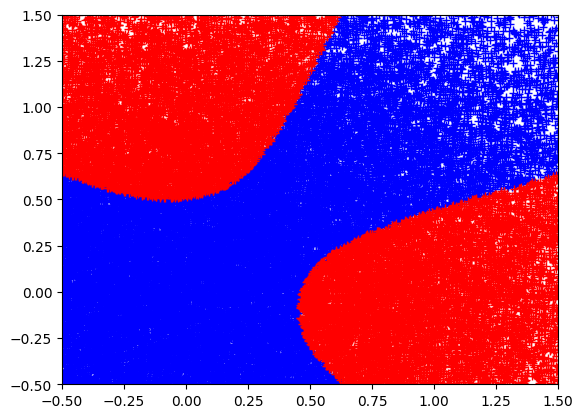

Epoca 16 | Loss: 0.0114 | Acuratețe: 1.00


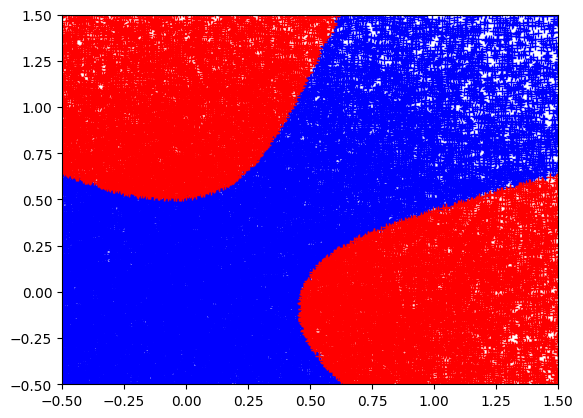

Epoca 17 | Loss: 0.0112 | Acuratețe: 1.00


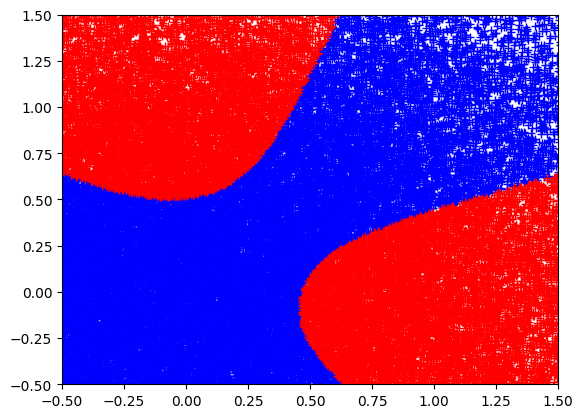

Epoca 18 | Loss: 0.0110 | Acuratețe: 1.00


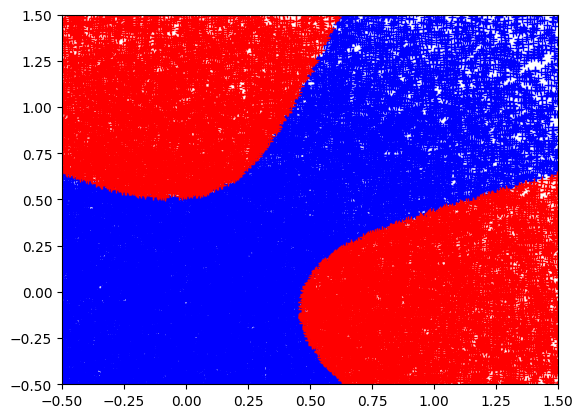

Epoca 19 | Loss: 0.0109 | Acuratețe: 1.00


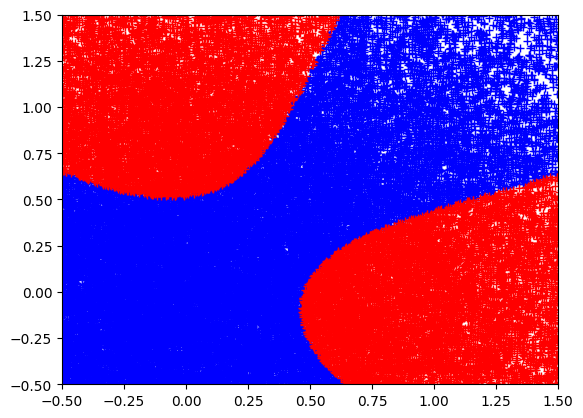

Epoca 20 | Loss: 0.0107 | Acuratețe: 1.00


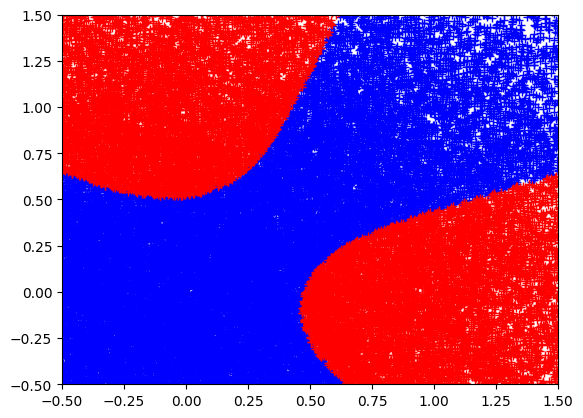

Epoca 21 | Loss: 0.0106 | Acuratețe: 1.00


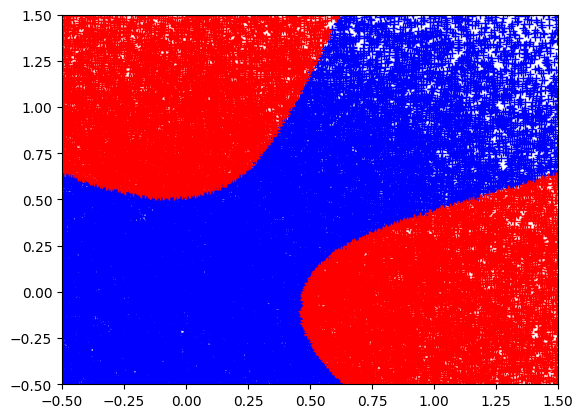

Epoca 22 | Loss: 0.0105 | Acuratețe: 1.00


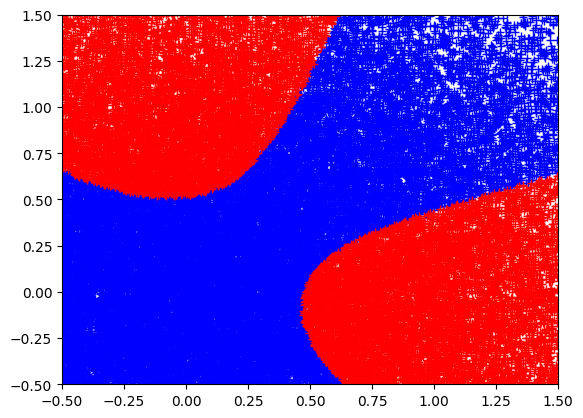

Epoca 23 | Loss: 0.0103 | Acuratețe: 1.00


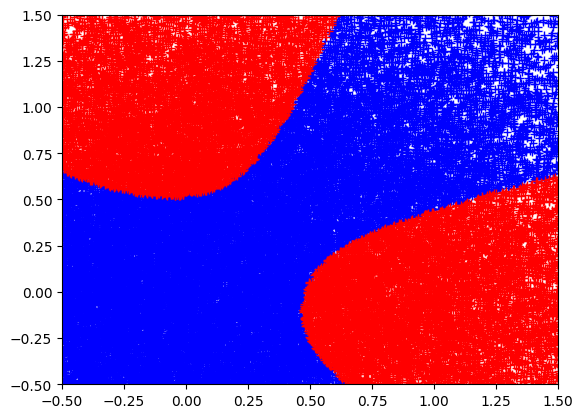

Epoca 24 | Loss: 0.0102 | Acuratețe: 1.00


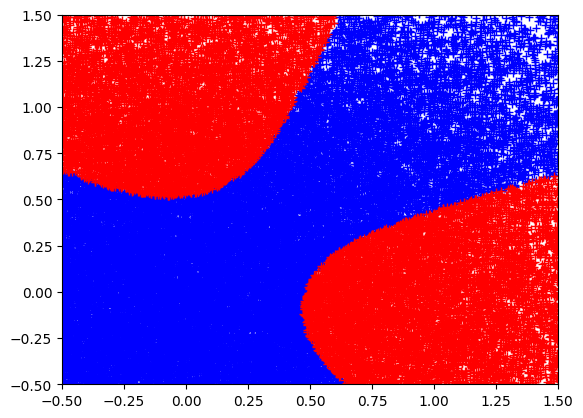

Epoca 25 | Loss: 0.0101 | Acuratețe: 1.00


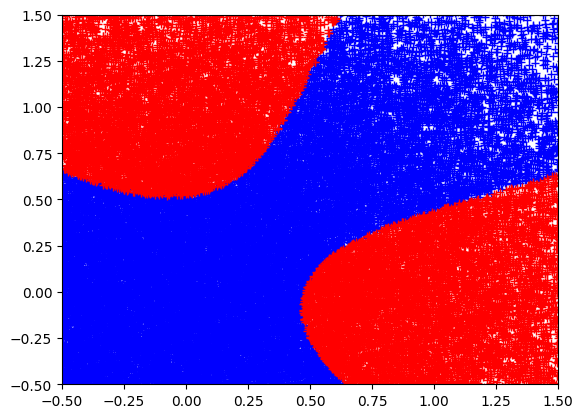

Epoca 26 | Loss: 0.0100 | Acuratețe: 1.00


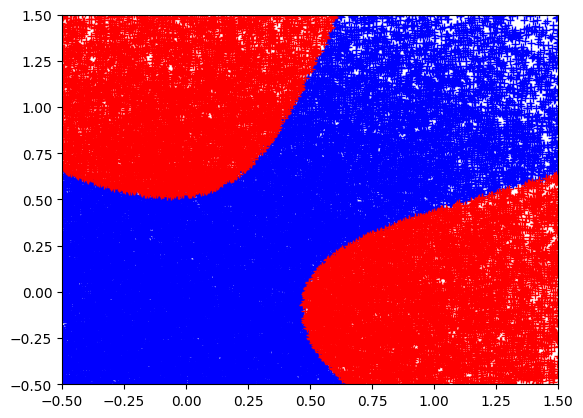

Epoca 27 | Loss: 0.0099 | Acuratețe: 1.00


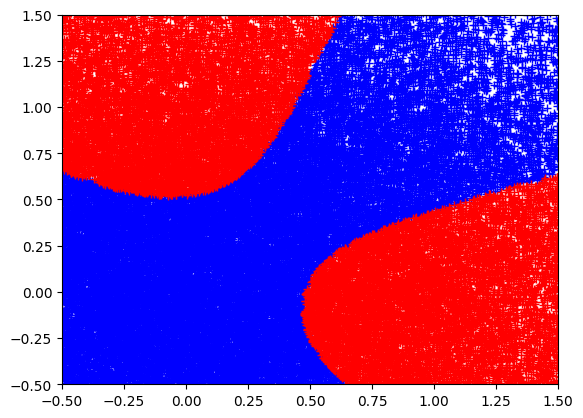

Epoca 28 | Loss: 0.0098 | Acuratețe: 1.00


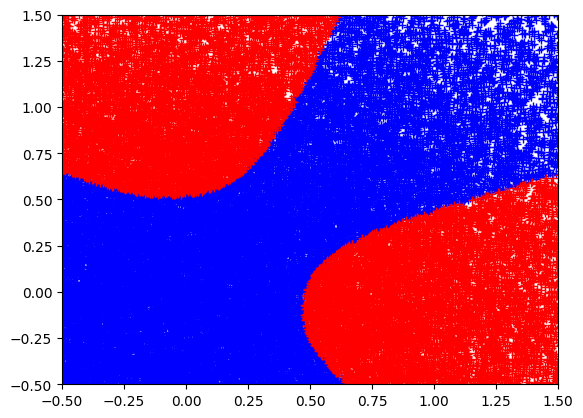

Epoca 29 | Loss: 0.0096 | Acuratețe: 1.00


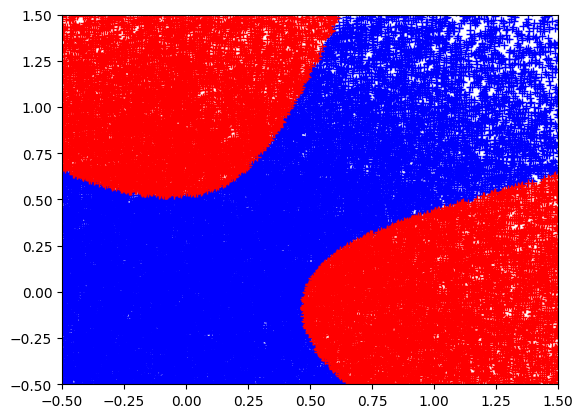

Epoca 30 | Loss: 0.0095 | Acuratețe: 1.00


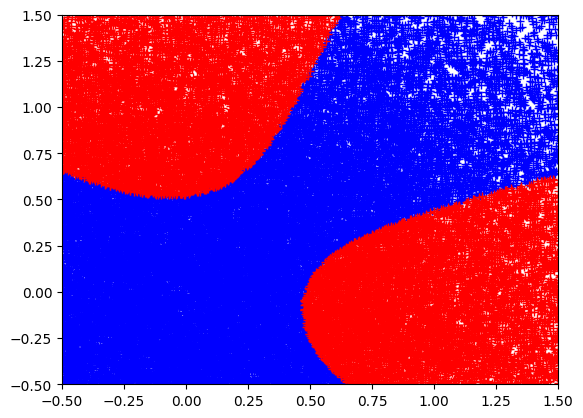

Epoca 31 | Loss: 0.0094 | Acuratețe: 1.00


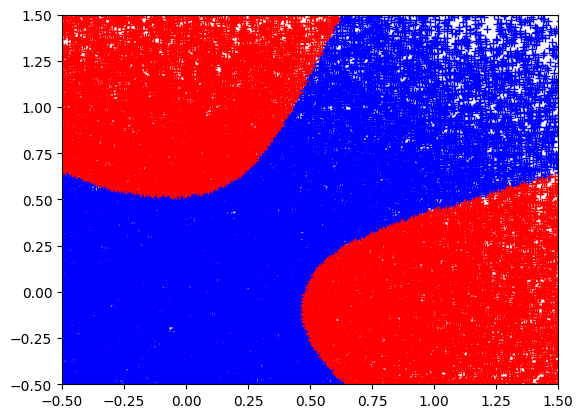

Epoca 32 | Loss: 0.0093 | Acuratețe: 1.00


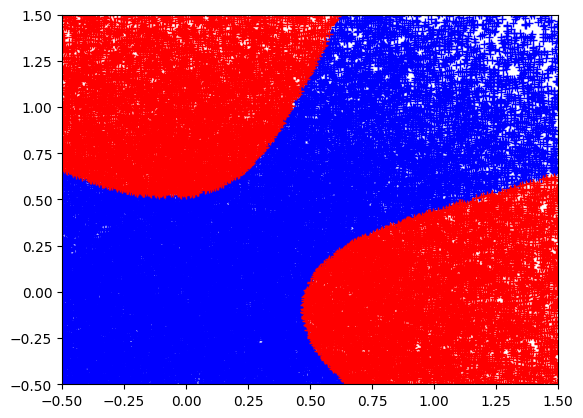

Epoca 33 | Loss: 0.0092 | Acuratețe: 1.00


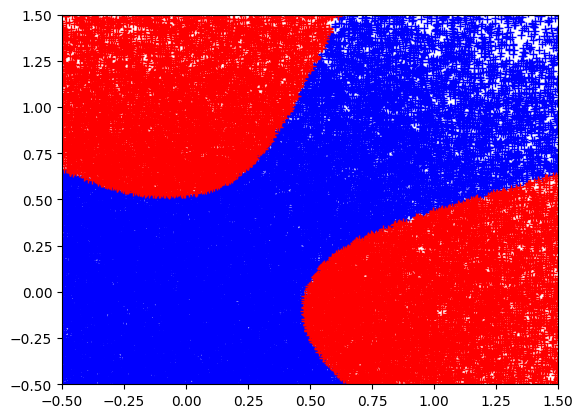

Epoca 34 | Loss: 0.0091 | Acuratețe: 1.00


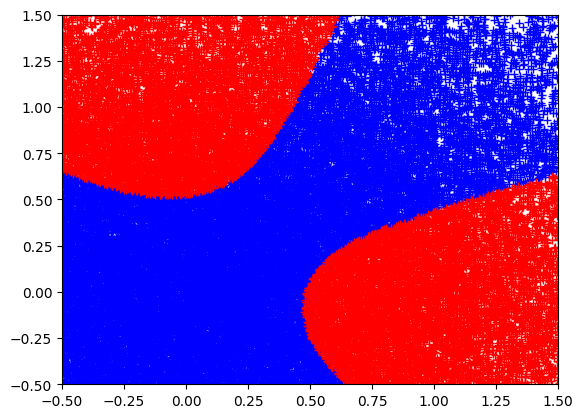

Epoca 35 | Loss: 0.0091 | Acuratețe: 1.00


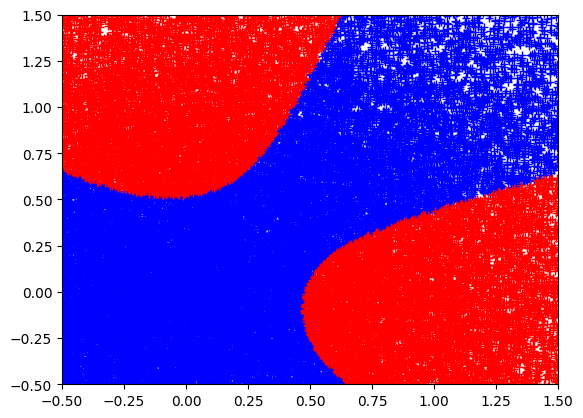

Epoca 36 | Loss: 0.0090 | Acuratețe: 1.00


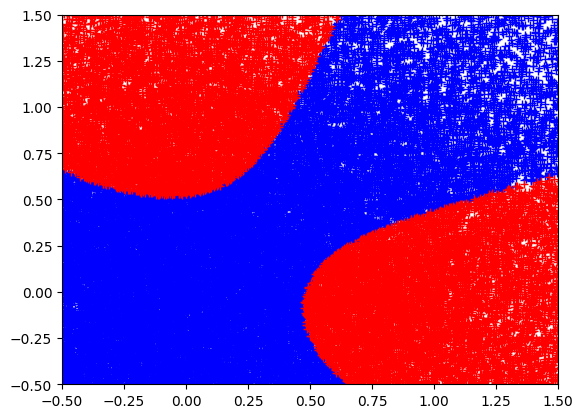

Epoca 37 | Loss: 0.0089 | Acuratețe: 1.00


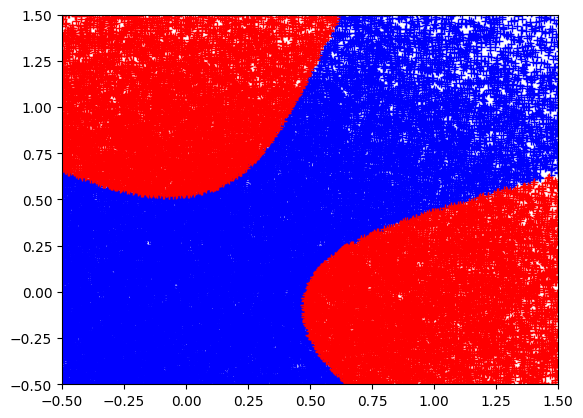

Epoca 38 | Loss: 0.0088 | Acuratețe: 1.00


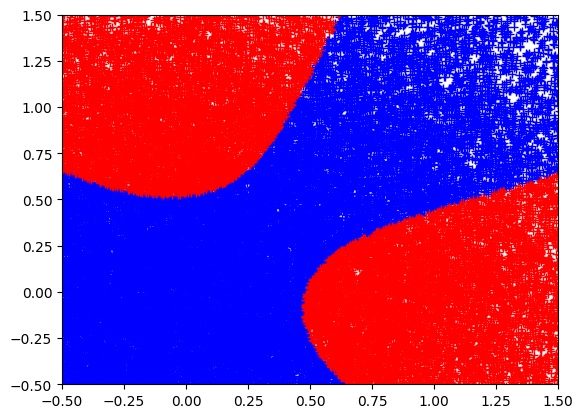

Epoca 39 | Loss: 0.0087 | Acuratețe: 1.00


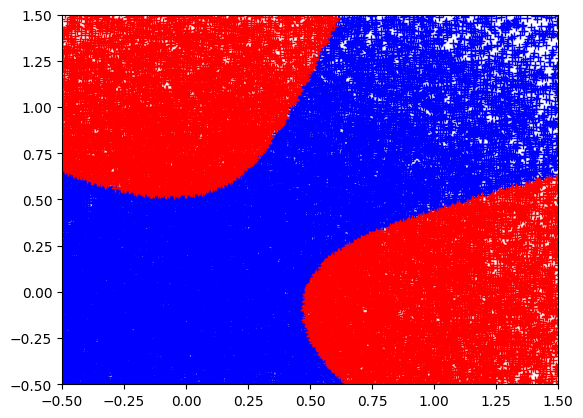

Epoca 40 | Loss: 0.0086 | Acuratețe: 1.00


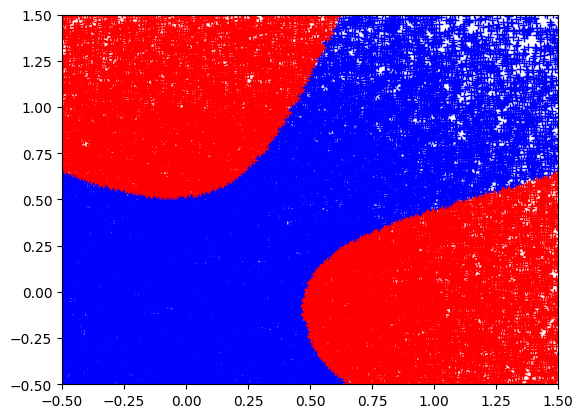

Epoca 41 | Loss: 0.0085 | Acuratețe: 1.00


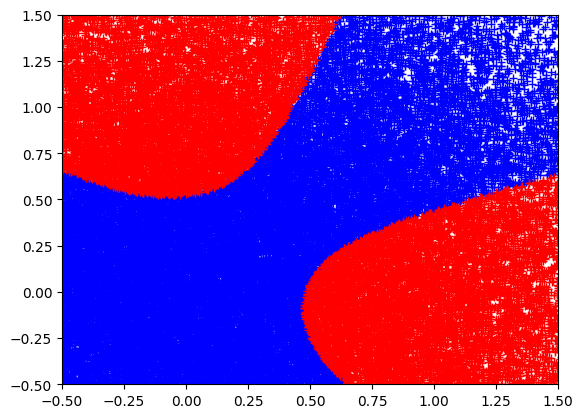

Epoca 42 | Loss: 0.0085 | Acuratețe: 1.00


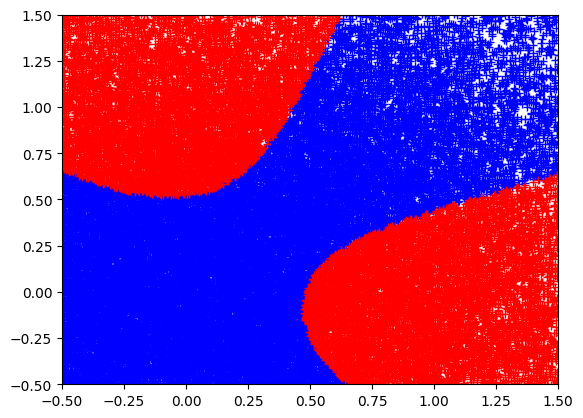

Epoca 43 | Loss: 0.0084 | Acuratețe: 1.00


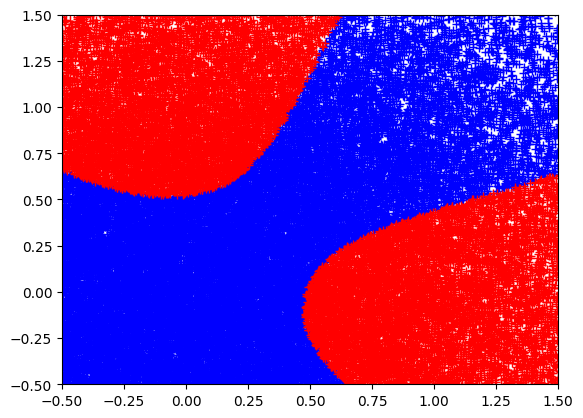

Epoca 44 | Loss: 0.0083 | Acuratețe: 1.00


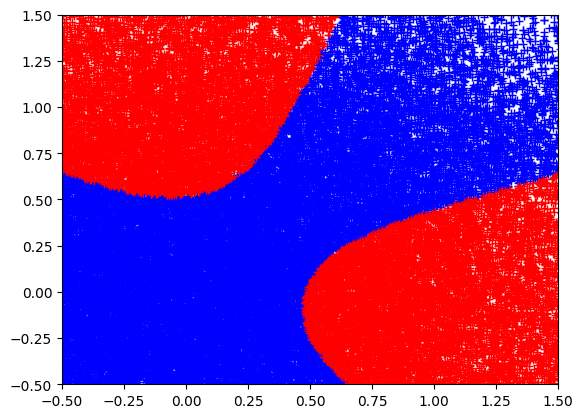

Epoca 45 | Loss: 0.0082 | Acuratețe: 1.00


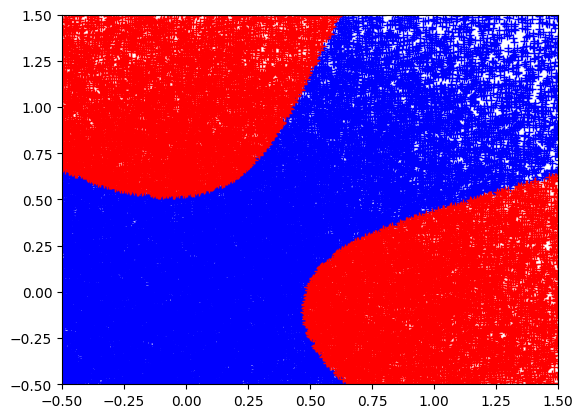

Epoca 46 | Loss: 0.0081 | Acuratețe: 1.00


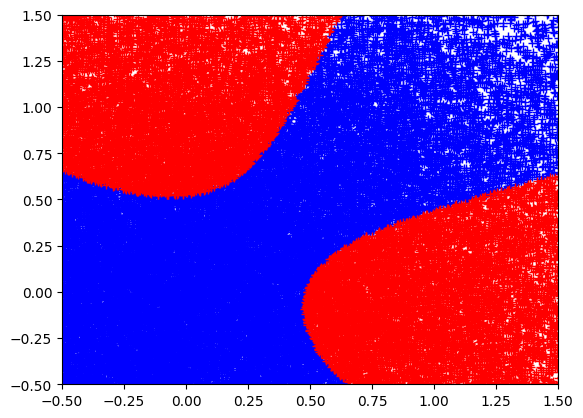

Epoca 47 | Loss: 0.0081 | Acuratețe: 1.00


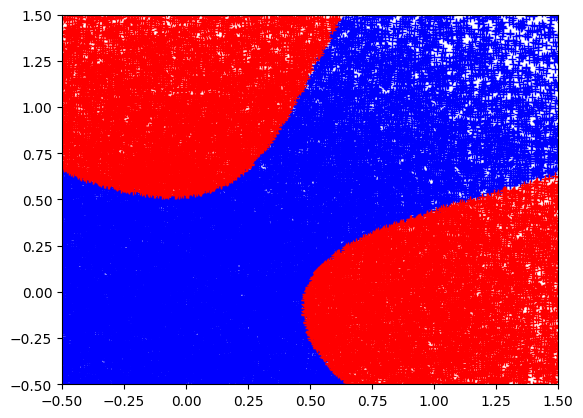

Epoca 48 | Loss: 0.0080 | Acuratețe: 1.00


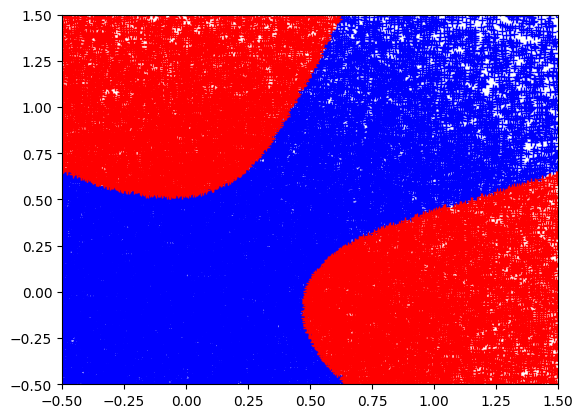

Epoca 49 | Loss: 0.0079 | Acuratețe: 1.00


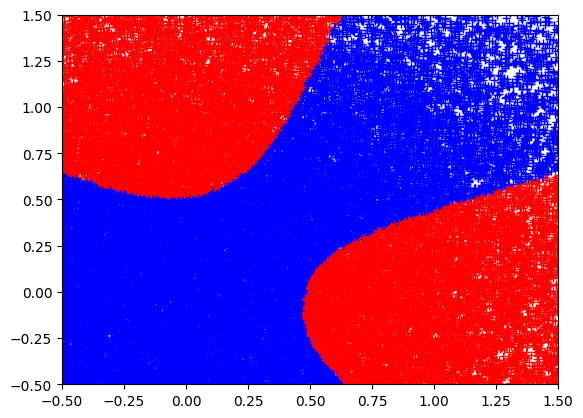

Epoca 50 | Loss: 0.0079 | Acuratețe: 1.00


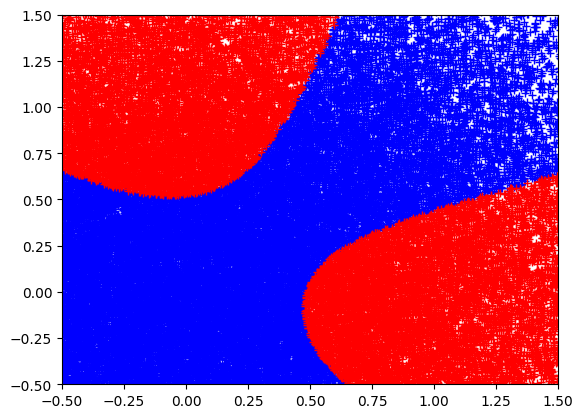

Epoca 51 | Loss: 0.0078 | Acuratețe: 1.00


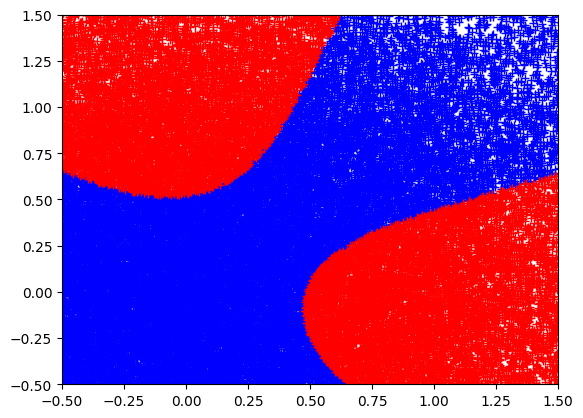

Epoca 52 | Loss: 0.0077 | Acuratețe: 1.00


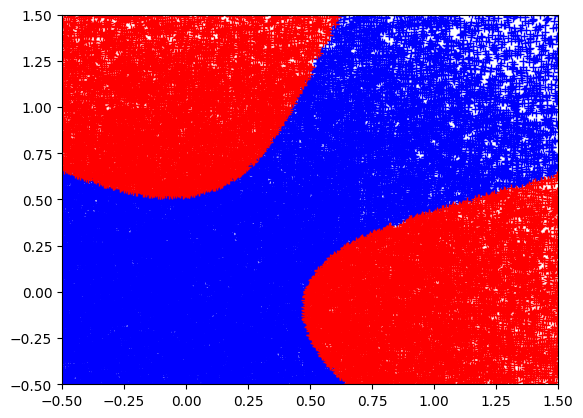

Epoca 53 | Loss: 0.0077 | Acuratețe: 1.00


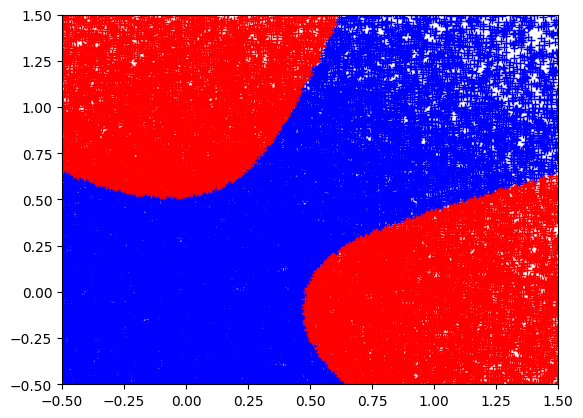

Epoca 54 | Loss: 0.0076 | Acuratețe: 1.00


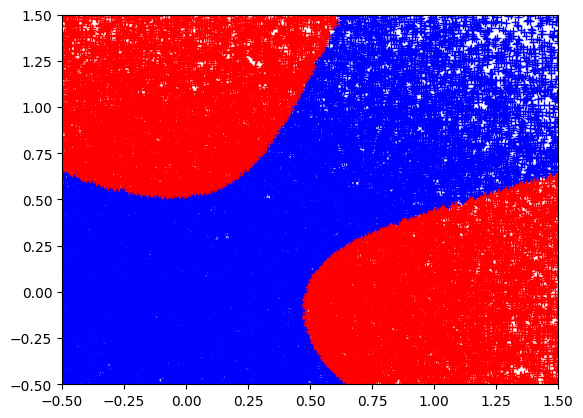

Epoca 55 | Loss: 0.0075 | Acuratețe: 1.00


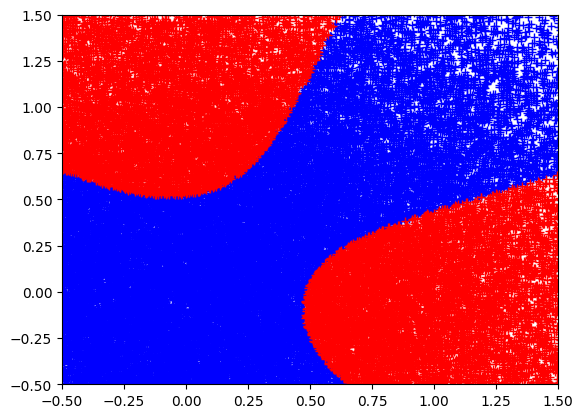

Epoca 56 | Loss: 0.0075 | Acuratețe: 1.00


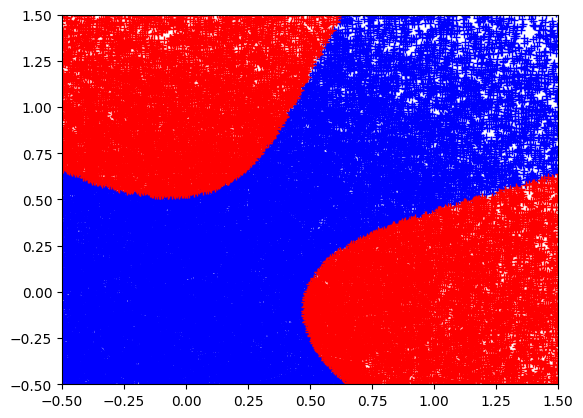

Epoca 57 | Loss: 0.0074 | Acuratețe: 1.00


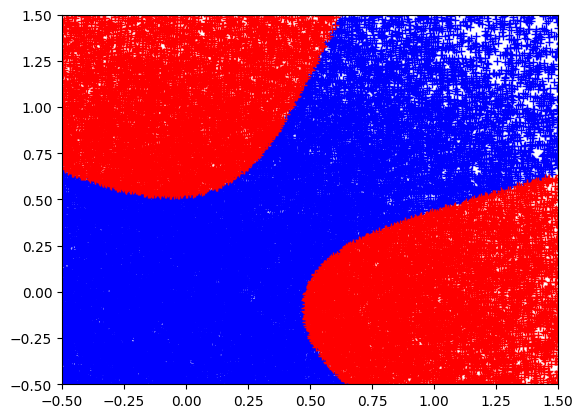

Epoca 58 | Loss: 0.0073 | Acuratețe: 1.00


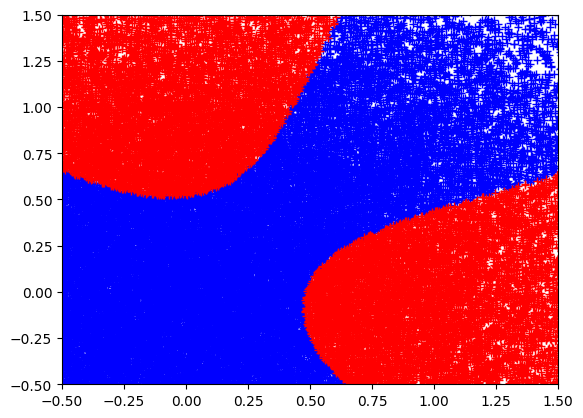

Epoca 59 | Loss: 0.0073 | Acuratețe: 1.00


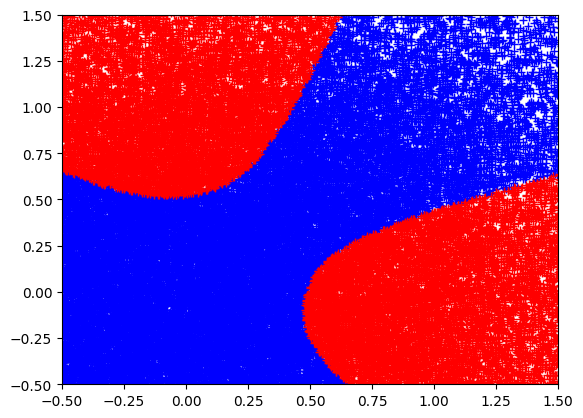

Epoca 60 | Loss: 0.0072 | Acuratețe: 1.00


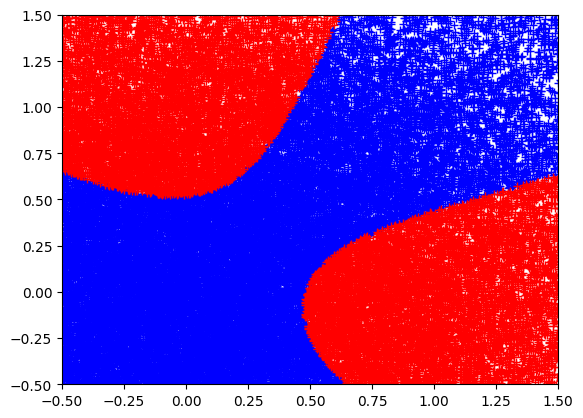

Epoca 61 | Loss: 0.0072 | Acuratețe: 1.00


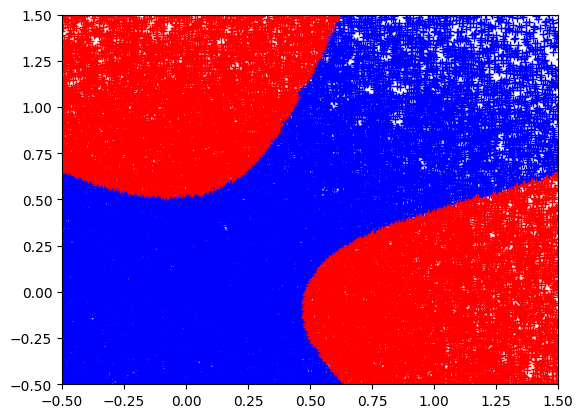

Epoca 62 | Loss: 0.0071 | Acuratețe: 1.00


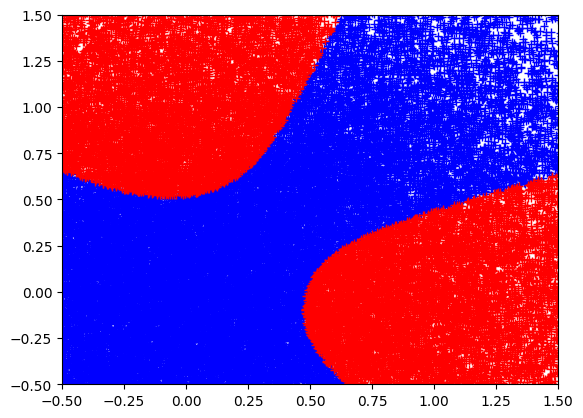

Epoca 63 | Loss: 0.0071 | Acuratețe: 1.00


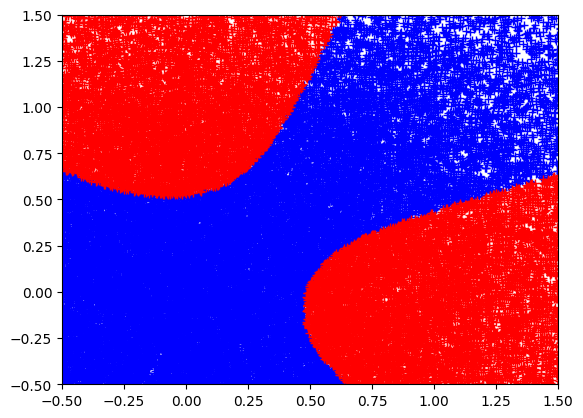

Epoca 64 | Loss: 0.0070 | Acuratețe: 1.00


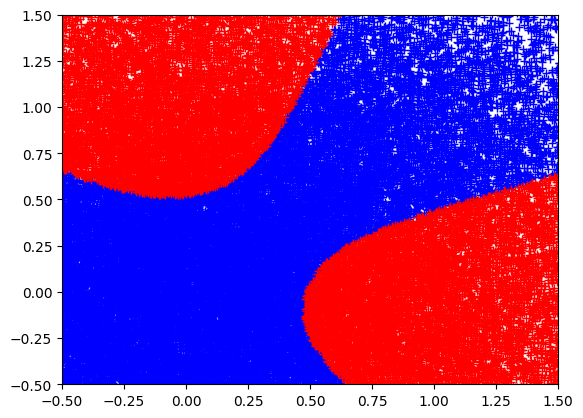

Epoca 65 | Loss: 0.0069 | Acuratețe: 1.00


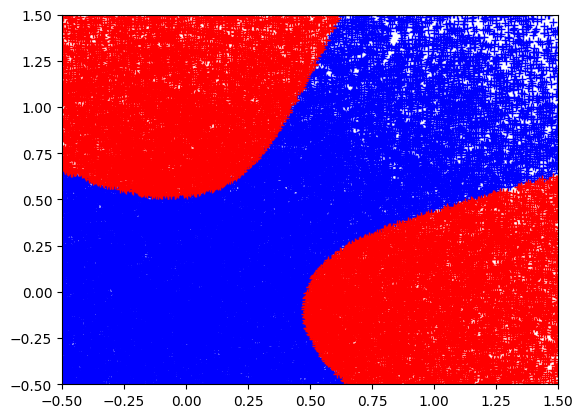

Epoca 66 | Loss: 0.0069 | Acuratețe: 1.00


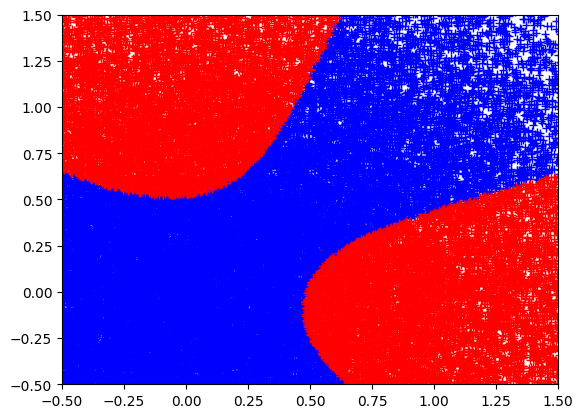

Epoca 67 | Loss: 0.0068 | Acuratețe: 1.00


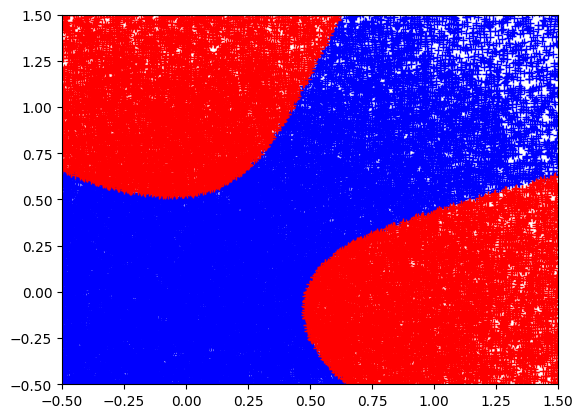

Epoca 68 | Loss: 0.0068 | Acuratețe: 1.00


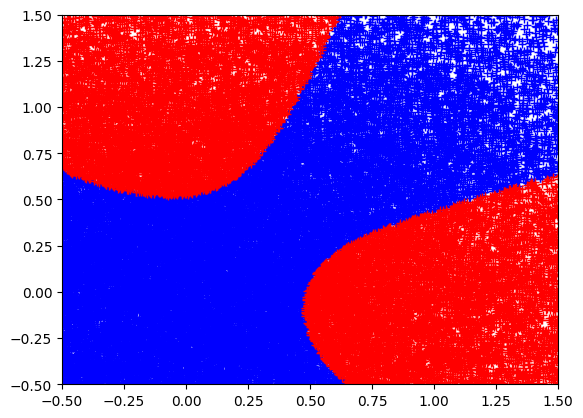

Epoca 69 | Loss: 0.0067 | Acuratețe: 1.00


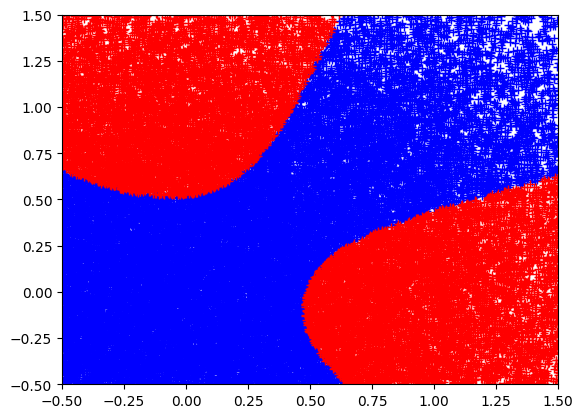

Epoca 70 | Loss: 0.0067 | Acuratețe: 1.00


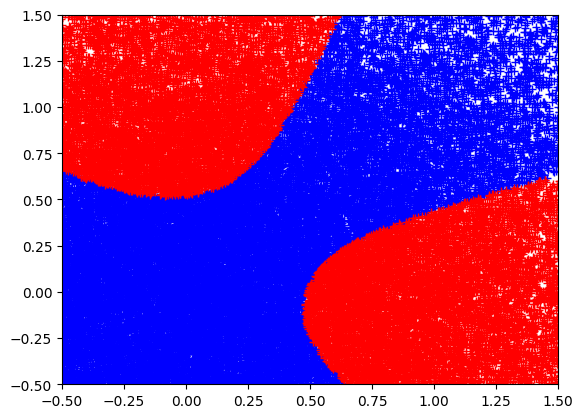

In [40]:
modelul = model()
modelul.train()